pre transform


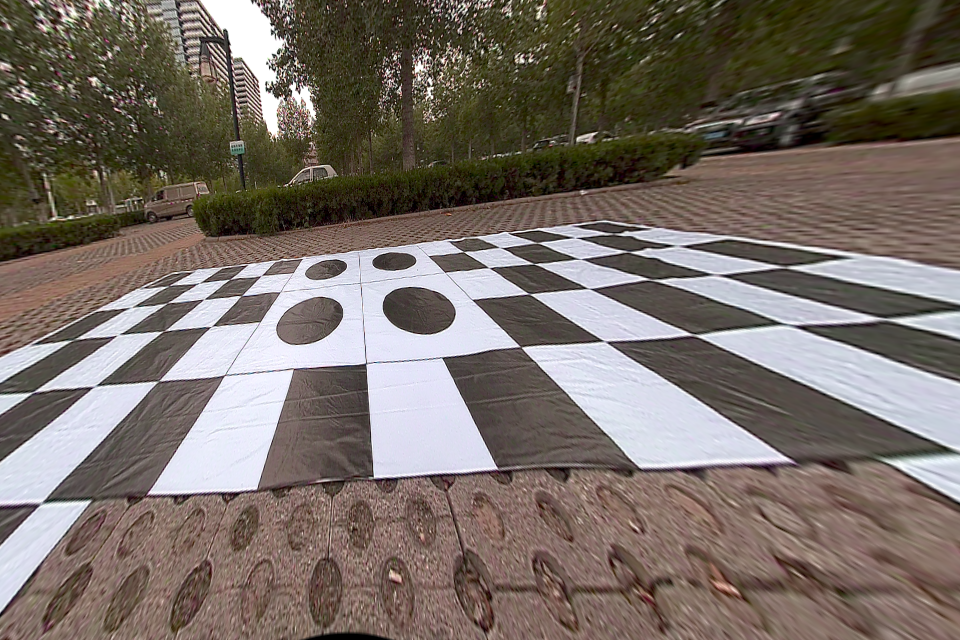

post transform


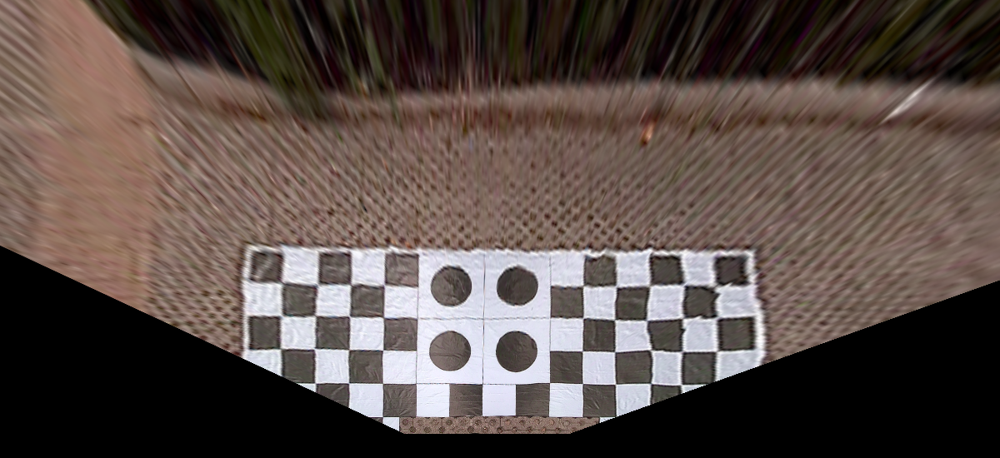

-1

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# To read the image
image = cv2.imread('original.png')

# Specify 4 corners in the image that need perspective transform
pt0 = [248, 264]
pt1 = [505, 232]
pt2 = [97, 386]
pt3 = [783, 324]

# Specify the width and the height of transformed image
width, height = 1200, 550

# Width and height of transformed image (Choice)
pts1 = np.float32([pt0, pt1, pt2, pt3])
pts2 = np.float32([[420, 300], [780, 300], [420, 460], [780, 460]])

# Apply perspective transform Method
matrix = cv2.getPerspectiveTransform(pts1, pts2)
result = cv2.warpPerspective(image, matrix, (width, height))

# Show the result
print('pre transform')

cv2_imshow(image)

print('post transform')
cv2_imshow(result)
cv2.waitKey()


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# To read the image
image = cv2.imread('choose_back.png')

# Specify 4 corners in the image that need perspective transform
pt0 = [312, 297]
pt1 = [616,299]
pt2 = [187,400]
pt3 = [718,401]

# Specify the width and the height of transformed image
width, height = 2000, 900

# Width and height of transformed image (Choice)
pts1 = np.float32([pt0, pt1, pt2, pt3])
pts2 = np.float32([[820, 370], [1180, 370], [820, 530], [1180, 530]])

# Apply perspective transform Method
matrix = cv2.getPerspectiveTransform(pts1, pts2)
result = cv2.warpPerspective(image, matrix, (width, height))

# Show the result
print('pre transform')

cv2_imshow(image)

print('post transform')
cv2_imshow(result)
cv2.waitKey()


error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/imgwarp.cpp:3280: error: (-215:Assertion failed) _src.total() > 0 in function 'warpPerspective'


# utils.py

In [ ]:
# UTILS TO IMPLEMENT THE DESCRIBED GET WEIGHTS MODULES WHICH UTILIZE PROXIMITIES TO DEFINED POLYGONS TO OBTAIN THEIR WEIGHT FUNCTIONS
import cv2
import numpy as np


def gstreamer_pipeline(cam_id=0,
                       capture_width=960,
                       capture_height=640,
                       framerate=60,
                       flip_method=2):
    """
    Use libgstreamer to open csi-cameras.
    """
    return ("nvarguscamerasrc sensor-id={} ! ".format(cam_id) + \
            "video/x-raw(memory:NVMM), "
            "width=(int)%d, height=(int)%d, "
            "format=(string)NV12, framerate=(fraction)%d/1 ! "
            "nvvidconv flip-method=%d ! "
            "video/x-raw, format=(string)BGRx ! "
            "videoconvert ! "
            "video/x-raw, format=(string)BGR ! appsink"
            % (capture_width,
               capture_height,
               framerate,
               flip_method
            )
    )


def convert_binary_to_bool(mask):
    """
    Convert a binary image (only one channel and pixels are 0 or 255) to
    a bool one (all pixels are 0 or 1).
    """
    return (mask.astype(np.float) / 255.0).astype(int)


def adjust_luminance(gray, factor):
    """
    Adjust the luminance of a grayscale image by a factor.
    """
    return np.minimum((gray * factor), 255).astype(np.uint8)


def get_mean_statistisc(gray, mask):
    """
    Get the total values of a gray image in a region defined by a mask matrix.
    The mask matrix must have values either 0 or 1.
    """
    return np.sum(gray * mask)


def mean_luminance_ratio(grayA, grayB, mask):
    return get_mean_statistisc(grayA, mask) / get_mean_statistisc(grayB, mask)


def get_mask(img):
    """
    Convert an image to a mask array.
    """
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, mask = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)
    return mask


def get_overlap_region_mask(imA, imB):
    """
    Given two images of the save size, get their overlapping region and
    convert this region to a mask array.
    """
    overlap = cv2.bitwise_and(imA, imB)
    mask = get_mask(overlap)
    mask = cv2.dilate(mask, np.ones((2, 2), np.uint8), iterations=2)
    return mask


def get_outmost_polygon_boundary(img):
    """
    Given a mask image with the mask describes the overlapping region of
    two images, get the outmost contour of this region.
    """
    mask = get_mask(img)
    mask = cv2.dilate(mask, np.ones((2, 2), np.uint8), iterations=2)
    cnts, hierarchy = cv2.findContours(
        mask,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE)[-2:]

    # get the contour with largest aera
    C = sorted(cnts, key=lambda x: cv2.contourArea(x), reverse=True)[0]

    # polygon approximation
    polygon = cv2.approxPolyDP(C, 0.009 * cv2.arcLength(C, True), True)

    return polygon


def get_weight_mask_matrix(imA, imB, dist_threshold=5):
    """
    Get the weight matrix G that combines two images imA, imB smoothly.
    """
    overlapMask = get_overlap_region_mask(imA, imB)
    overlapMaskInv = cv2.bitwise_not(overlapMask)
    indices = np.where(overlapMask == 255)

    imA_diff = cv2.bitwise_and(imA, imA, mask=overlapMaskInv)
    imB_diff = cv2.bitwise_and(imB, imB, mask=overlapMaskInv)

    G = get_mask(imA).astype(np.float32) / 255.0

    polyA = get_outmost_polygon_boundary(imA_diff)
    polyB = get_outmost_polygon_boundary(imB_diff)

    for y, x in zip(*indices):

        #convert this x,y int an INT tuple
        xy_tuple = tuple([int(x), int(y)])
        distToB = cv2.pointPolygonTest(polyB, xy_tuple, True)

        if distToB < dist_threshold:
            distToA = cv2.pointPolygonTest(polyA, xy_tuple, True)
            distToB *= distToB
            distToA *= distToA
            G[y, x] = distToB / (distToA + distToB)

    return G, overlapMask


def make_white_balance(image):
    """
    Adjust white balance of an image base on the means of its channels.
    """
    B, G, R = cv2.split(image)
    m1 = np.mean(B)
    m2 = np.mean(G)
    m3 = np.mean(R)
    K = (m1 + m2 + m3) / 3
    c1 = K / m1
    c2 = K / m2
    c3 = K / m3
    B = adjust_luminance(B, c1)
    G = adjust_luminance(G, c2)
    R = adjust_luminance(R, c3)
    return cv2.merge((B, G, R))

# param_settings.py

In [ ]:
# PARAM_SETTINGS INCLUDED TO DEFINE THE COORDINATES PRESENT IN THE PLAYING FIELD!

import os
import cv2


camera_names = ["front", "back", "left", "right"]

# --------------------------------------------------------------------
# (shift_width, shift_height): how far away the birdview looks outside
# of the calibration pattern in horizontal and vertical directions
shift_w = 300
shift_h = 300

# size of the gap between the calibration pattern and the car
# in horizontal and vertical directions
inn_shift_w = 20
inn_shift_h = 50

# total width/height of the stitched image
total_w = 600 + 2 * shift_w
total_h = 1000 + 2 * shift_h

# four corners of the rectangular region occupied by the car
# top-left (x_left, y_top), bottom-right (x_right, y_bottom)
xl = shift_w + 180 + inn_shift_w
xr = total_w - xl
yt = shift_h + 200 + inn_shift_h
yb = total_h - yt
# --------------------------------------------------------------------

project_shapes = {
    "front": (total_w, yt),
    "back":  (total_w, yt),
    "left":  (total_h, xl),
    "right": (total_h, xl)
}

# pixel locations of the four points to be chosen.
# you must click these pixels in the same order when running
# the get_projection_map.py script
project_keypoints = {
    "front": [(shift_w + 120, shift_h),
              (shift_w + 480, shift_h),
              (shift_w + 120, shift_h + 160),
              (shift_w + 480, shift_h + 160)],

    "back":  [(shift_w + 120, shift_h),
              (shift_w + 480, shift_h),
              (shift_w + 120, shift_h + 160),
              (shift_w + 480, shift_h + 160)],

    "left":  [(shift_h + 280, shift_w),
              (shift_h + 840, shift_w),
              (shift_h + 280, shift_w + 160),
              (shift_h + 840, shift_w + 160)],

    "right": [(shift_h + 160, shift_w),
              (shift_h + 720, shift_w),
              (shift_h + 160, shift_w + 160),
              (shift_h + 720, shift_w + 160)]
}

# CAR.PNG MUST BE UPLOADED
car_image = cv2.imread(os.path.join(os.getcwd(), "images", "car.png"))
car_image = cv2.resize(car_image, (xr - xl, yb - yt))

# fisheye_camera.py

In [ ]:
import os
import numpy as np
import cv2

class FisheyeCameraModel(object):

    """
    Fisheye camera model, for undistorting, projecting and flipping camera frames.
    """

    def __init__(self, camera_param_file, camera_name):
        if not os.path.isfile(camera_param_file):
            raise ValueError("Cannot find camera param file")

        if camera_name not in camera_names:
            raise ValueError("Unknown camera name: {}".format(camera_name))

        self.camera_file = camera_param_file
        self.camera_name = camera_name
        self.scale_xy = (1.0, 1.0)
        self.shift_xy = (0, 0)
        self.undistort_maps = None
        self.project_matrix = None
        self.project_shape = project_shapes[self.camera_name]
        self.load_camera_params()

    def load_camera_params(self):
        fs = cv2.FileStorage(self.camera_file, cv2.FILE_STORAGE_READ)
        self.camera_matrix = fs.getNode("camera_matrix").mat()
        self.dist_coeffs = fs.getNode("dist_coeffs").mat()
        self.resolution = fs.getNode("resolution").mat().flatten()

        scale_xy = fs.getNode("scale_xy").mat()
        if scale_xy is not None:
            self.scale_xy = scale_xy

        shift_xy = fs.getNode("shift_xy").mat()
        if shift_xy is not None:
            self.shift_xy = shift_xy

        # Project matrix is within the yaml already

        project_matrix = fs.getNode("project_matrix").mat()
        if project_matrix is not None:
            self.project_matrix = project_matrix

        fs.release()
        self.update_undistort_maps()

    def update_undistort_maps(self):
        new_matrix = self.camera_matrix.copy()
        new_matrix[0, 0] *= self.scale_xy[0]
        new_matrix[1, 1] *= self.scale_xy[1]
        new_matrix[0, 2] += self.shift_xy[0]
        new_matrix[1, 2] += self.shift_xy[1]
        width, height = self.resolution

        self.undistort_maps = cv2.fisheye.initUndistortRectifyMap(
            self.camera_matrix,
            self.dist_coeffs,
            np.eye(3),
            new_matrix,
            (width, height),
            cv2.CV_16SC2
        )
        return self

    def set_scale_and_shift(self, scale_xy=(1.0, 1.0), shift_xy=(0, 0)):
        self.scale_xy = scale_xy
        self.shift_xy = shift_xy
        self.update_undistort_maps()
        return self

    def undistort(self, image):
        result = cv2.remap(image, *self.undistort_maps, interpolation=cv2.INTER_LINEAR,
                           borderMode=cv2.BORDER_CONSTANT)
        return result

    def project(self, image):
        result = cv2.warpPerspective(image, self.project_matrix, self.project_shape)
        return result

    def flip(self, image):
        if self.camera_name == "front":
            return image.copy()

        elif self.camera_name == "back":
            return image.copy()[::-1, ::-1, :]

        elif self.camera_name == "left":
            return cv2.transpose(image)[::-1]

        else:
            return np.flip(cv2.transpose(image), 1)

    def save_data(self):
        fs = cv2.FileStorage(self.camera_file, cv2.FILE_STORAGE_WRITE)
        fs.write("camera_matrix", self.camera_matrix)
        fs.write("dist_coeffs", self.dist_coeffs)
        fs.write("resolution", self.resolution)
        fs.write("project_matrix", self.project_matrix)
        fs.write("scale_xy", np.float32(self.scale_xy))
        fs.write("shift_xy", np.float32(self.shift_xy))
        fs.release()

# birdview.py

In [ ]:
import os
import numpy as np
import cv2
from PIL import Image
#from PyQt5.QtCore import QMutex, QWaitCondition, QMutexLocker
#from .base_thread import BaseThread
#from .imagebuffer import Buffer
#from . import param_settings as settings
#from .param_settings import xl, xr, yt, yb
#from . import utils

# Functions that select the approriate pieces of picture inputted to obtain the regions that will be used in stitching
# These functions differentiate three regions from all camera directions, namely left, middle and right blocks.

def FI(front_image):
    return front_image[:, :xl]


def FII(front_image):
    return front_image[:, xr:]


def FM(front_image):
    return front_image[:, xl:xr]


def BIII(back_image):
    return back_image[:, :xl]


def BIV(back_image):
    return back_image[:, xr:]


def BM(back_image):
    return back_image[:, xl:xr]


def LI(left_image):
    return left_image[:yt, :]


def LIII(left_image):
    return left_image[yb:, :]


def LM(left_image):
    return left_image[yt:yb, :]


def RII(right_image):
    return right_image[:yt, :]


def RIV(right_image):
    return right_image[yb:, :]


def RM(right_image):
    return right_image[yt:yb, :]

# Birdview class which contains all the functions that will be used in creating a birdview image of the vehicle
# REMEMBER THAT YOU MAY NEED TO QUICKLY INCLUDE BASETHREAD CODE, COULD BE THAT THIS IS ACTUALLY NOT NECESSARY, YOU FORSURE NEED TO INCLUDE AND IMPORT THE SETTINGS CODE THO
# CHECK THE IMPORTS TO SEE WHAT OTHER CODES YOU NEED TO INCLUDE, NOTE THAT FEW THINGS ARE CHANGED SINCE WE ARE WORKING IN A COLAB ENVIRONMENT, SO NO LONGER INHERETS FROM BASETHREADS FOR EXAMPLE
# WE ALSO DONT USE UTILS. AS THE FUNCTIONS ARE JUST DIRECTLY INCLUDED IN PREVIOUS CELLS.

class BirdView:

    def __init__(self):
      #,
                 #proc_buffer_manager=None,
                 #drop_if_full=True,
                 #buffer_size=8,
                 #parent=None):
        #super(BirdView, self).__init__(parent)
        #self.proc_buffer_manager = proc_buffer_manager
        #self.drop_if_full = drop_if_full
        #self.buffer = Buffer(buffer_size)
        self.image = np.zeros((total_h, total_w, 3), np.uint8)
        self.weights = None
        self.masks = None
        self.car_image = car_image
        self.frames = None

# The update frames just puts the list of images in the self.frames attribute, which will be used to load the images in the member functions of this class

    def update_frames(self, images):
        self.frames = images

# This is the merging function, which takes the weighted average based on weight G, which is computed in the utils.py module

    def merge(self, imA, imB, k):
        G = self.weights[k]
        return (imA * G + imB * (1 - G)).astype(np.uint8)

    # The following properties all change specific regions in the self.image attribute of a BirdView() object
    # These regions will be copied to from the 4 input picture regions, with merging taking place in overlapping regions

    @property
    def FL(self):
        return self.image[:yt, :xl]

    @property
    def F(self):
        return self.image[:yt, xl:xr]

    @property
    def FR(self):
        return self.image[:yt, xr:]

    @property
    def BL(self):
        return self.image[yb:, :xl]

    @property
    def B(self):
        return self.image[yb:, xl:xr]

    @property
    def BR(self):
        return self.image[yb:, xr:]

    @property
    def L(self):
        return self.image[yt:yb, :xl]

    @property
    def R(self):
        return self.image[yt:yb, xr:]

    @property
    def C(self):
        return self.image[yt:yb, xl:xr]

    # This is the actual stitching algorithm, it directly copies the middle regions of the front back left and right pictures, while first merging two input streams before copying to the overlapping regions
    # The code below copies the car image to the approriate place, the car image is put in the approriate attribute and copied from settings.py (see __init__)
    # self.merge is weighted average module, takes imA, imB, k, k used for self.weights[k], so that is what the 0, 1, 2, 3, refer to. They select for the used weight

    def stitch_all_parts(self):
        front, back, left, right = self.frames
        np.copyto(self.F, FM(front))
        np.copyto(self.B, BM(back))
        np.copyto(self.L, LM(left))
        np.copyto(self.R, RM(right))
        np.copyto(self.FL, self.merge(FI(front), LI(left), 0))
        np.copyto(self.FR, self.merge(FII(front), RII(right), 1))
        np.copyto(self.BL, self.merge(BIII(back), LIII(left), 2))
        np.copyto(self.BR, self.merge(BIV(back), RIV(right), 3))

    def copy_car_image(self):
        np.copyto(self.C, self.car_image)

    # Brightness correction protocol using adjust_luminance and mean_luminance_ratio functions that can be found in utils.py, the full explanation for the correction is found in OneNote

    def make_luminance_balance(self):

        def tune(x):
            if x >= 1:
                return x * np.exp((1 - x) * 0.5)
            else:
                return x * np.exp((1 - x) * 0.8)

        front, back, left, right = self.frames
        m1, m2, m3, m4 = self.masks
        Fb, Fg, Fr = cv2.split(front)
        Bb, Bg, Br = cv2.split(back)
        Lb, Lg, Lr = cv2.split(left)
        Rb, Rg, Rr = cv2.split(right)

        a1 = mean_luminance_ratio(RII(Rb), FII(Fb), m2)
        a2 = mean_luminance_ratio(RII(Rg), FII(Fg), m2)
        a3 = mean_luminance_ratio(RII(Rr), FII(Fr), m2)

        b1 = mean_luminance_ratio(BIV(Bb), RIV(Rb), m4)
        b2 = mean_luminance_ratio(BIV(Bg), RIV(Rg), m4)
        b3 = mean_luminance_ratio(BIV(Br), RIV(Rr), m4)

        c1 = mean_luminance_ratio(LIII(Lb), BIII(Bb), m3)
        c2 = mean_luminance_ratio(LIII(Lg), BIII(Bg), m3)
        c3 = mean_luminance_ratio(LIII(Lr), BIII(Br), m3)

        d1 = mean_luminance_ratio(FI(Fb), LI(Lb), m1)
        d2 = mean_luminance_ratio(FI(Fg), LI(Lg), m1)
        d3 = mean_luminance_ratio(FI(Fr), LI(Lr), m1)

        t1 = (a1 * b1 * c1 * d1)**0.25
        t2 = (a2 * b2 * c2 * d2)**0.25
        t3 = (a3 * b3 * c3 * d3)**0.25

        x1 = t1 / (d1 / a1)**0.5
        x2 = t2 / (d2 / a2)**0.5
        x3 = t3 / (d3 / a3)**0.5

        x1 = tune(x1)
        x2 = tune(x2)
        x3 = tune(x3)

        Fb = adjust_luminance(Fb, x1)
        Fg = adjust_luminance(Fg, x2)
        Fr = adjust_luminance(Fr, x3)

        y1 = t1 / (b1 / c1)**0.5
        y2 = t2 / (b2 / c2)**0.5
        y3 = t3 / (b3 / c3)**0.5

        y1 = tune(y1)
        y2 = tune(y2)
        y3 = tune(y3)

        Bb = adjust_luminance(Bb, y1)
        Bg = adjust_luminance(Bg, y2)
        Br = adjust_luminance(Br, y3)

        z1 = t1 / (c1 / d1)**0.5
        z2 = t2 / (c2 / d2)**0.5
        z3 = t3 / (c3 / d3)**0.5

        z1 = tune(z1)
        z2 = tune(z2)
        z3 = tune(z3)

        Lb = adjust_luminance(Lb, z1)
        Lg = adjust_luminance(Lg, z2)
        Lr = adjust_luminance(Lr, z3)

        w1 = t1 / (a1 / b1)**0.5
        w2 = t2 / (a2 / b2)**0.5
        w3 = t3 / (a3 / b3)**0.5

        w1 = tune(w1)
        w2 = tune(w2)
        w3 = tune(w3)

        Rb = adjust_luminance(Rb, w1)
        Rg = adjust_luminance(Rg, w2)
        Rr = adjust_luminance(Rr, w3)

        self.frames = [cv2.merge((Fb, Fg, Fr)),
                       cv2.merge((Bb, Bg, Br)),
                       cv2.merge((Lb, Lg, Lr)),
                       cv2.merge((Rb, Rg, Rr))]
        return self


# This is the weight and mask computing function, only the weight function is used for the stitching part, self.masks is used in the make_luminance_balance member function of this class
# Weights are computed for the upper left, upper right, lower left and lower right overlapping regions. This is done based on the get_weights_and_masks module from utils.py.

    def get_weights_and_masks(self, images):
        front, back, left, right = images
        G0, M0 = get_weight_mask_matrix(FI(front), LI(left))
        G1, M1 = get_weight_mask_matrix(FII(front), RII(right))
        G2, M2 = get_weight_mask_matrix(BIII(back), LIII(left))
        G3, M3 = get_weight_mask_matrix(BIV(back), RIV(right))
        self.weights = [np.stack((G, G, G), axis=2) for G in (G0, G1, G2, G3)]
        self.masks = [(M / 255.0).astype(int) for M in (M0, M1, M2, M3)]
        return np.stack((G0, G1, G2, G3), axis=2), np.stack((M0, M1, M2, M3), axis=2)


# White balance module, using utils.py, explanation for this is given in OneNote as well.

    def make_white_balance(self):
        self.image = make_white_balance(self.image)



# display_image

In [ ]:
# So, essentially, this function displays an image in a window and waits for user input.
# If the user presses 'q', the window is closed, and if the user presses 'Enter', the function returns 1.
# If the window is closed by other means (e.g., clicking the close button), the function also returns -1.


def display_image(window_title, image):
    cv2.imshow(window_title, image)
    while True:
        click = cv2.getWindowProperty(window_title, cv2.WND_PROP_AUTOSIZE)
        if click < 0:
            return -1

        key = cv2.waitKey(1) & 0xFF
        if key == ord("q"):
            return -1

        # 'Enter' key is detected!
        if key == 13:
            return 1

# run_get_weight_matrices.py

<ipython-input-6-6ef0bbadff46>:52: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  new_matrix[0, 0] *= self.scale_xy[0]
<ipython-input-6-6ef0bbadff46>:53: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  new_matrix[1, 1] *= self.scale_xy[1]
<ipython-input-6-6ef0bbadff46>:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  new_matrix[0, 2] += self.shift_xy[0]
<ipython-input-6-6ef0bbadff46>:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecat

Bird's eye view stitched image after luminance balance
Bird's eye view stitched image


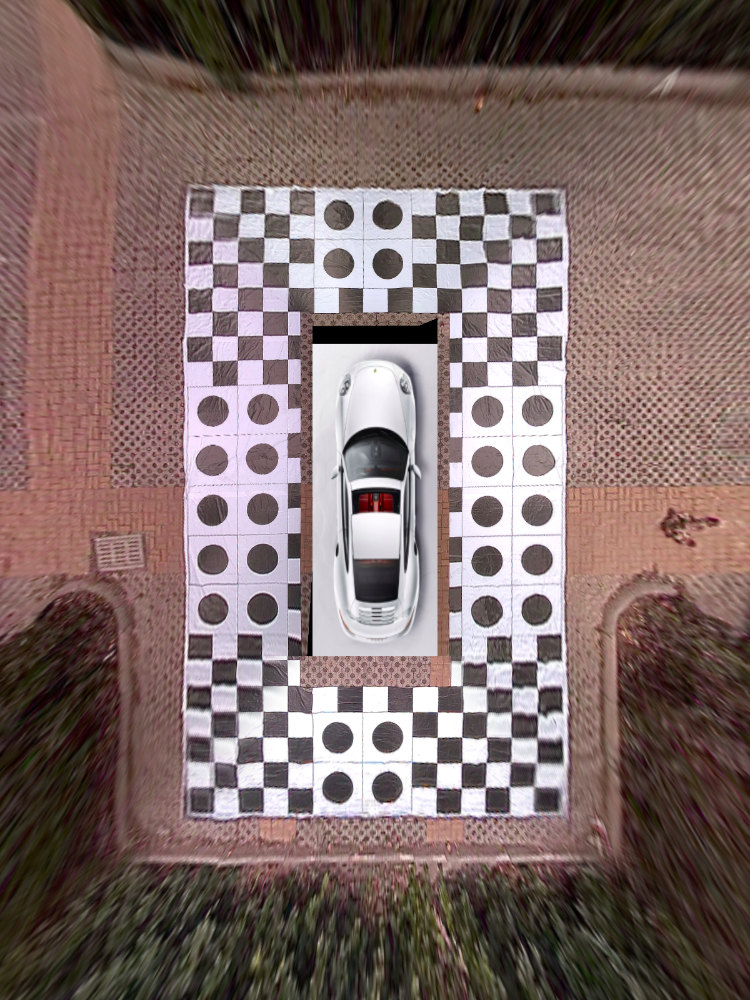

Bird's eye view stitched image after added white balance


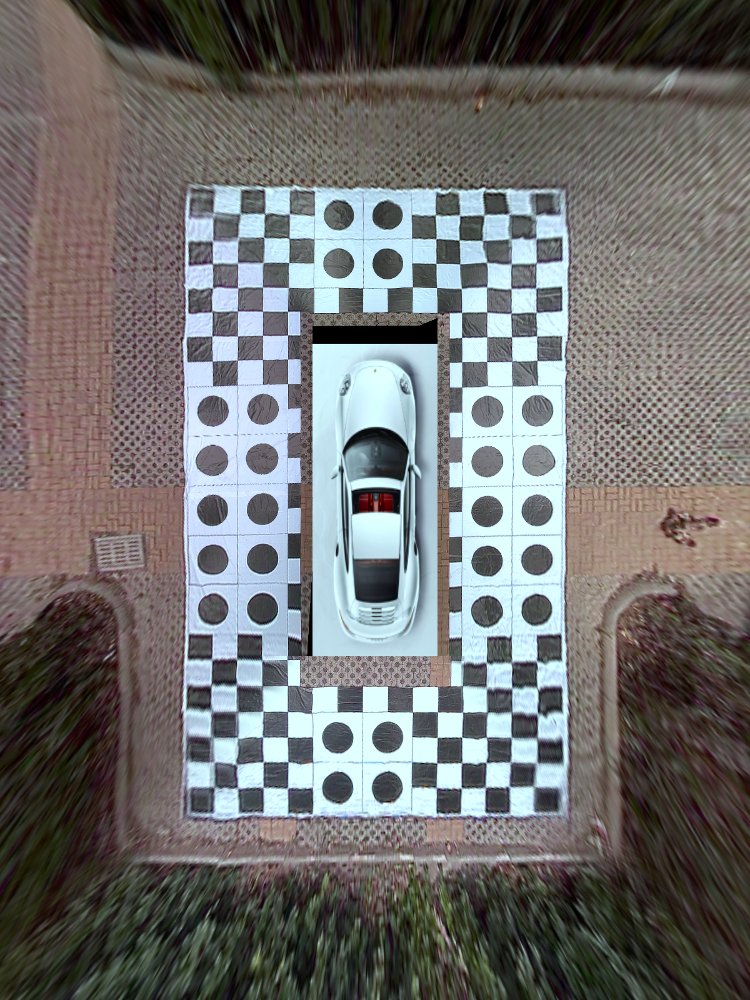

In [ ]:
import os
import numpy as np
import cv2
from PIL import Image
from google.colab.patches import cv2_imshow
# from surround_view import FisheyeCameraModel, display_image, BirdView
# import surround_view.param_settings as settings


# NOTE: TO RUN THIS MAIN BODY, YOU NEED:
######## A LIST OF THE CAMERA_NAMES, THE DISTORTED IMAGES OF THE CAMERAS
######## THE FISHEYE-DISTORTED IMAGES OF THE CAMERAS
######## THE FILLED OUT YAML FILES => STILL HAVE TO FOLLOW THE FLOW WITH WHICH THE YAML FILES ARE FILLED OUT.


def main():
    # names are imported from settings.py, or param_settings. This just refers to front, back, left and right names of the png images.
    # They extract these images of the 4 used cameras and the yamls containing specifications of the 4 cameras.
    # With these, the FisheyeCameraModel object modelling each of the 4 cameras can completed. This gives access to the undistort, project and flip member functions defined in this class.
    names = camera_names
    images = [os.path.join(os.getcwd(), "images", name + ".png") for name in names]
    yamls = [os.path.join(os.getcwd(), "yaml", name + ".yaml") for name in names]
    camera_models = [FisheyeCameraModel(camera_file, camera_name) for camera_file, camera_name in zip (yamls, names)]

    # 'images' is now a list containing the 4 distorted fisheye images
    # We iterate silumtaneously through the images and the cameras with which these specific cameras were made, and perform the transformation using the camera-specific FisheyeModel objects
    projected = []
    for image_file, camera in zip(images, camera_models):
        img = cv2.imread(image_file)
        img = camera.undistort(img)
        img = camera.project(img)
        img = camera.flip(img)
        projected.append(img)

    # AFTER THIS POINT UNDISTORTED, FLIPPED AND PROJECTED

    # The undistorted, projected and approriately flipped images are then appended to the list 'projected', which now contains ground referred and approriately oriented images.
    # BirdView() object is initialized, which holds self.image attribute which is initially an array of zeroes with the approriate dimensions
    # The weights for the merging in the overlapping regions is obtained, and color balances are performed. Display image module is used to visualize the resutling birdseye view

    birdview = BirdView()
    Gmat, Mmat = birdview.get_weights_and_masks(projected)
    birdview.update_frames(projected)
    #birdview.make_luminance_balance().stitch_all_parts()

    birdview.make_luminance_balance()
    #print("Bird's eye view stitched image after luminance balance")

    birdview.stitch_all_parts()
    birdview.copy_car_image()
    #print("Bird's eye view stitched image")
    # cv2_imshow(birdview.image)

    # birdview_height, birdview_width, _ = birdview.image.shape
    # print('birdview height is', birdview_height, 'and birdview_width is', birdview_width)


    birdview.make_white_balance()
    print("Bird's eye view stitched image after added white balance")
    cv2_imshow(birdview.image)

    #ret = display_image("BirdView Result", birdview.image)
    #if ret > 0:
      #  Image.fromarray((Gmat * 255).astype(np.uint8)).save("weights.png")
       # Image.fromarray(Mmat.astype(np.uint8)).save("masks.png")

main()

## Video

<ipython-input-6-6ef0bbadff46>:52: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  new_matrix[0, 0] *= self.scale_xy[0]
<ipython-input-6-6ef0bbadff46>:53: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  new_matrix[1, 1] *= self.scale_xy[1]
<ipython-input-6-6ef0bbadff46>:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  new_matrix[0, 2] += self.shift_xy[0]
<ipython-input-6-6ef0bbadff46>:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecat

300


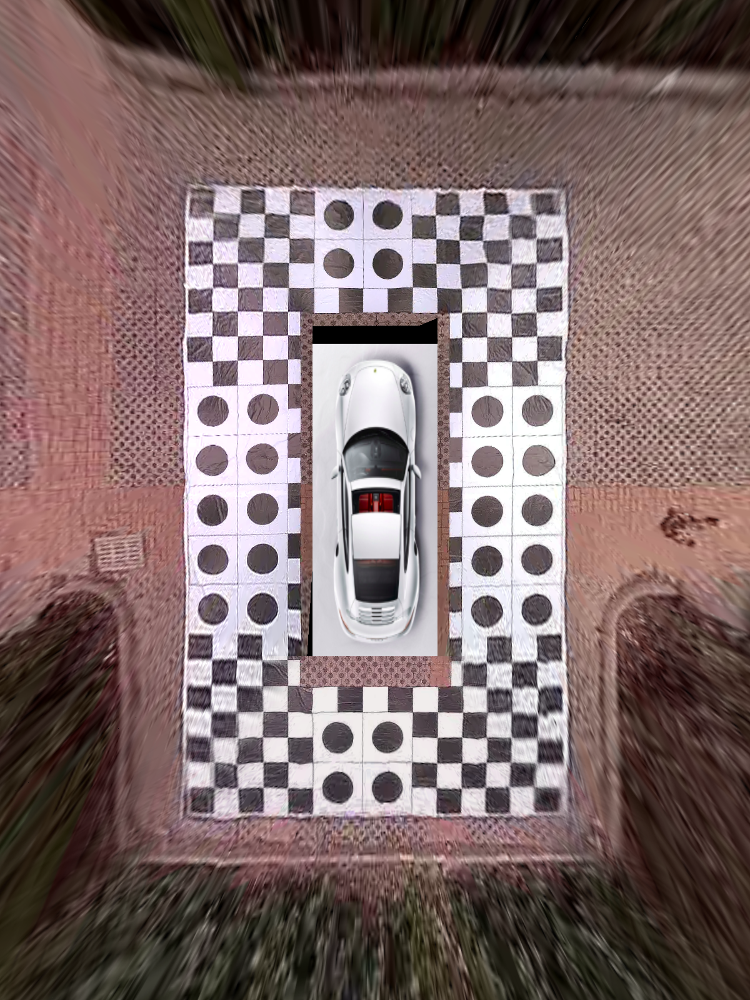

True
True
True
True
Output video saved to /content/output/birds_eye_view.mp4


In [ ]:
import os
import cv2
import numpy as np
from PIL import Image
from google.colab.patches import cv2_imshow

# from surround_view import FisheyeCameraModel, BirdView

def process_video(input_videos, output_video, camera_models):
    # Open video files
    caps = [cv2.VideoCapture(video) for video in input_videos]
    if not all(cap.isOpened() for cap in caps):
        print("Error: One or more video files couldn't be opened.")
        return

    # Get video properties
    width = int(caps[0].get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(caps[0].get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(caps[0].get(cv2.CAP_PROP_FPS))
    frame_count = int(caps[0].get(cv2.CAP_PROP_FRAME_COUNT))
    print(frame_count)

    # Define the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video, fourcc, fps, (1200, 1600))

    birdview = BirdView()

    for i in range(frame_count):
        frames = []
        for cap in caps:
            ret, frame = cap.read()
            if not ret:
                print(f"Error: Couldn't read frame {i}.")
                break
            frames.append(frame)

        if len(frames) != len(camera_models):
            break

        # Process each frame
        projected = []
        for frame, camera in zip(frames, camera_models):
            img = camera.undistort(frame)
            img = camera.project(img)
            img = camera.flip(img)
            projected.append(img)

        # Stitch frames into a bird's eye view

        if i == 0:
          Gmat, Mmat = birdview.get_weights_and_masks(projected)

        birdview.update_frames(projected)
        birdview.make_luminance_balance()
        birdview.stitch_all_parts()
        birdview.copy_car_image()
        #birdview.make_luminance_balance()
        #birdview.make_white_balance()
        if i == 0:
          cv2_imshow(birdview.image)

        birdview_height, birdview_width, _ = birdview.image.shape

        if ((birdview_height, birdview_width) != (1600, 1200)):
          print(f'frame {i} is false')
        else:
          if i == 1 or i == 10 or i == 100 or i == 200:
            print('True')

        # Write the frame to the output video
        out.write(birdview.image)

    # Release video files and writer
    for cap in caps:
        cap.release()
    out.release()
    print(f"Output video saved to {output_video}")

def main():
    camera_names = ["front", "back", "left", "right"]  # Example camera names
    videos = [os.path.join(os.getcwd(), "videos", name + ".mp4") for name in camera_names]
    yamls = [os.path.join(os.getcwd(), "yaml", name + ".yaml") for name in camera_names]
    camera_models = [FisheyeCameraModel(camera_file, camera_name) for camera_file, camera_name in zip(yamls, camera_names)]

    output_video = os.path.join(os.getcwd(), "output", "birds_eye_view.mp4")
    process_video(videos, output_video, camera_models)

main()